# Bring Audio from Spectrogram

In [70]:
import os
import io
import base64

from IPython.display import display, Audio, HTML
import ipywidgets as widgets
from PIL import Image
import librosa
import torch
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd

from bring_features_and_file_paths import bring_features_and_file_paths, from_spectrogram_path_to_BirdNET_output_path, get_BirdNET_detections

In [71]:
features_path = '/projects/MultiActiveAI/Samir_VICReg_Outputs/features_third_pass'
indices_path = '/projects/MultiActiveAI/Samir_VICReg_Outputs/indices_third_pass/include_indices.pth'
label_predictions_path = '/projects/MultiActiveAI/Samir_VICReg_Outputs/indices_third_pass/label_predictions.pth'

birdnet_pase_path = '/grand/projects/BirdAudio/Soundscapes/BirdNET_Output'
spectrogram_base_path = '/grand/projects/BirdAudio/Soundscapes/Spectrograms'
audio_base_path = '/grand/projects/BirdAudio/Soundscapes/Audio_Files/'

In [72]:
features, file_paths = bring_features_and_file_paths(features_path)
indices = torch.load(indices_path)
label_predictions = torch.load(label_predictions_path)

print(f"features is of shape {features.shape}")
print(f"file_paths is of shape {file_paths.shape}")
print(f"indices is of shape {indices.shape}")
print(f"label predictions is of shape {label_predictions.shape}")

We have 2136286 feature vectors.
features is of shape torch.Size([2136286, 2048])
file_paths is of shape torch.Size([2136286, 81])
indices is of shape (212417,)
label predictions is of shape (212417,)


In [73]:
cluster = 50
# cluster 83 (pewee)
# cluster 3 (indigo bunting)

In [74]:
cluster_indices = indices[label_predictions == cluster]

sampled_features = features[cluster_indices]
sampled_file_paths = file_paths[cluster_indices]

print(f"Cluster contains {len(cluster_indices)} samples.")

Cluster contains 737 samples.



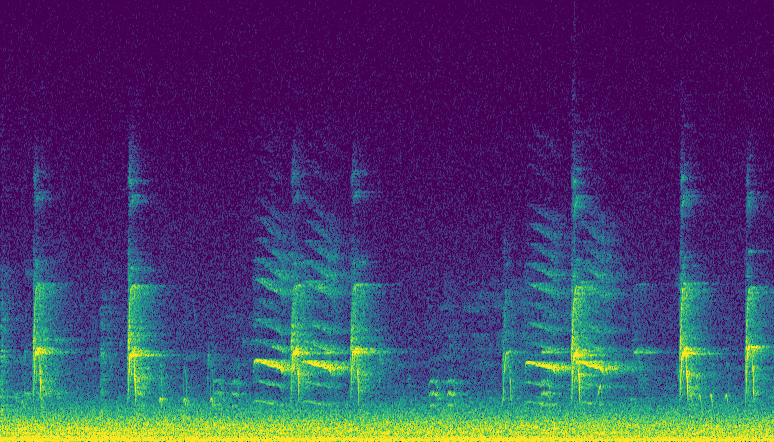


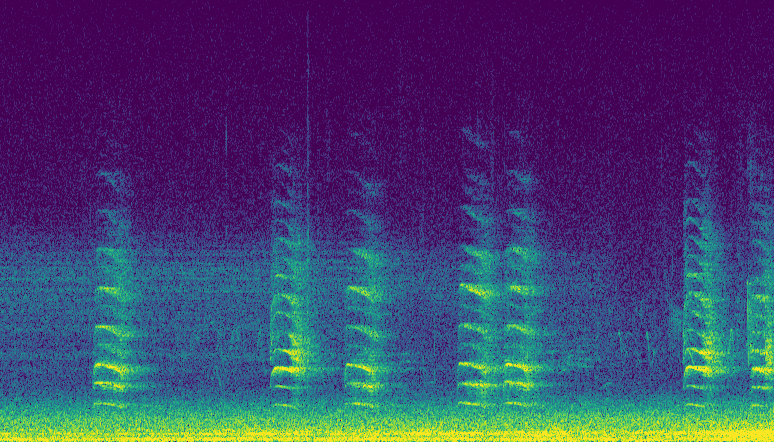


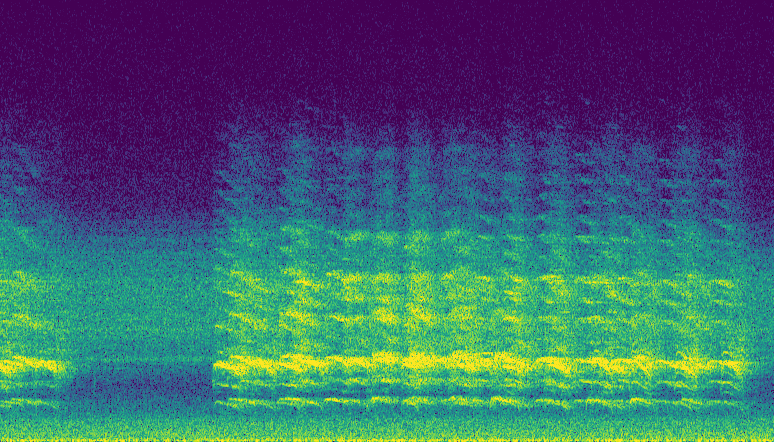


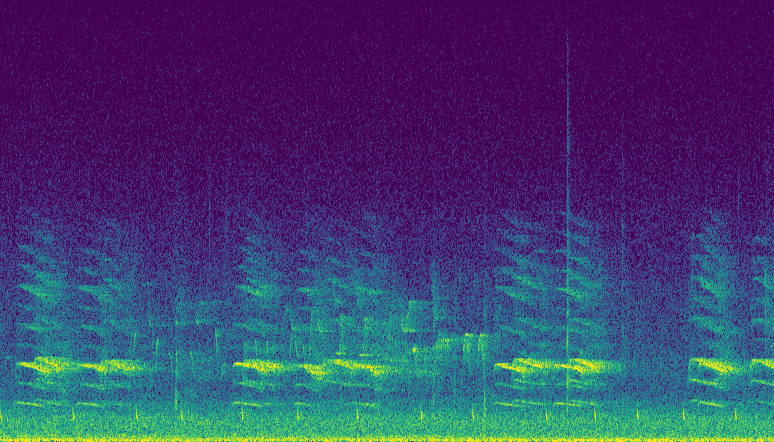


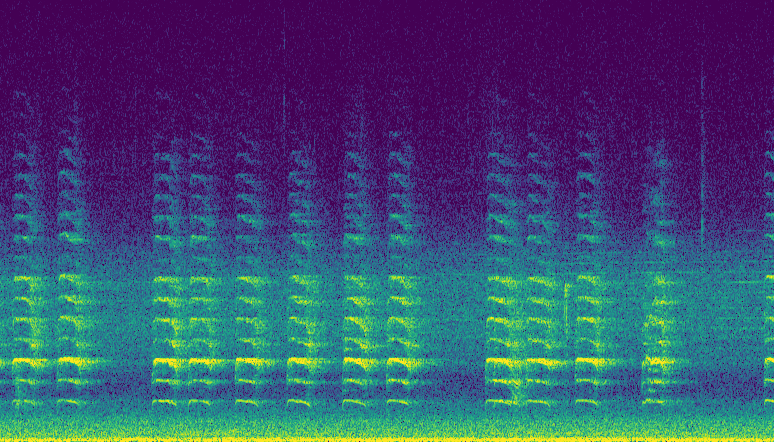


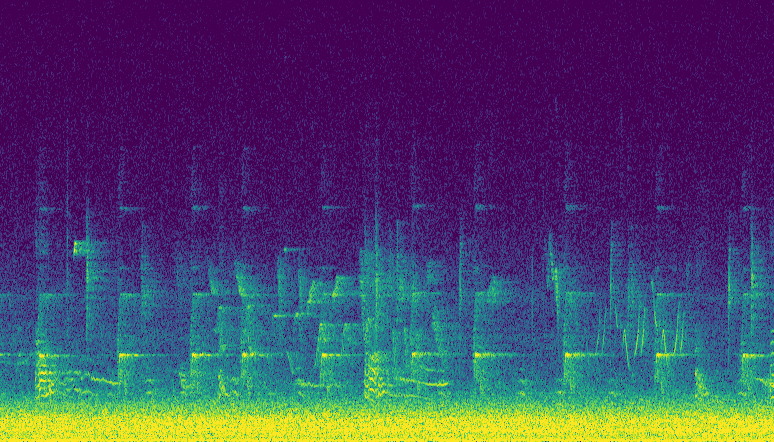


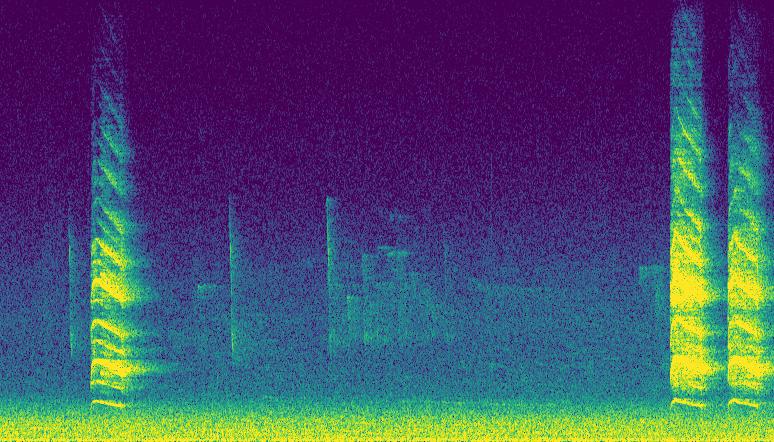


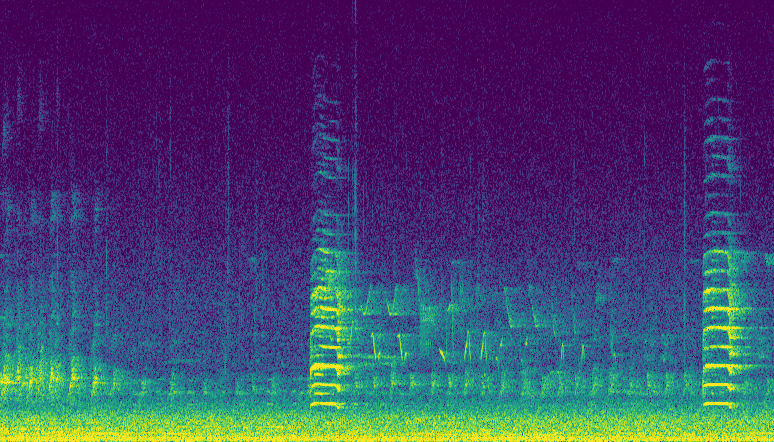


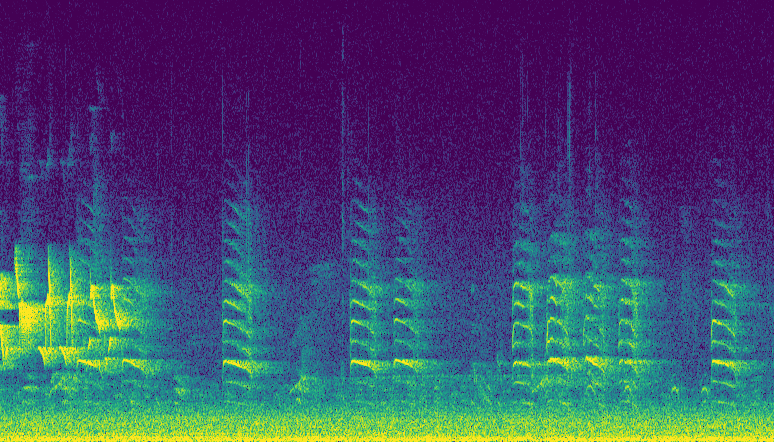


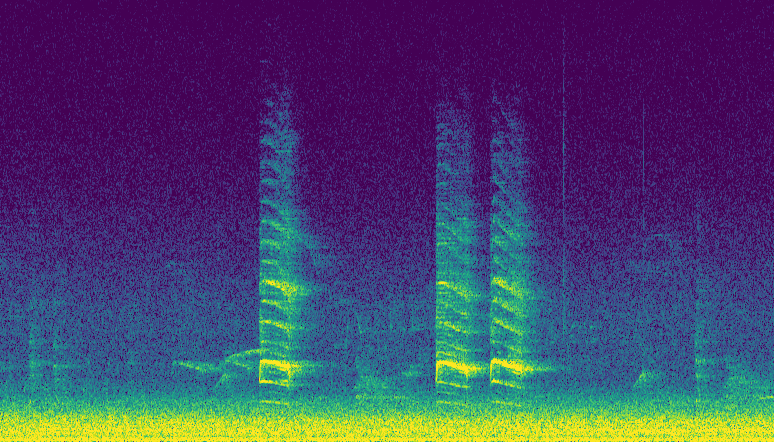

In [156]:
for i in range(10):
    spectrogram_path_encoded = sampled_file_paths[i]
    spectrogram_path = ''.join([chr(int(x)) for x in spectrogram_path_encoded]).replace('~','')
    
    audio_path_prefix, spectrogram_file_name = os.path.split(spectrogram_path)
    audio_file_name = os.path.splitext(spectrogram_file_name)[0][:24] + '.wav'
    audio_path = os.path.join(audio_path_prefix, audio_file_name)
    
    audio_path = os.path.join(audio_base_path, audio_path)
    spectrogram_path = os.path.join(spectrogram_base_path, spectrogram_path)
    
    birdnet_path = from_spectrogram_path_to_BirdNET_output_path(spectrogram_path_encoded)
    birdnet_path = os.path.join(birdnet_pase_path, birdnet_path)
    
    spectrogram_length = 9.0
    audio_start_time = float(os.path.splitext(spectrogram_file_name)[0][25:]) * spectrogram_length
    y, sr = librosa.load(audio_path, offset=audio_start_time, duration=spectrogram_length)
    audio = Audio(data=y, rate=sr)
    
    spectrogram = matplotlib.image.imread(spectrogram_path)  
    buffer = io.BytesIO()
    plt.imsave(buffer, spectrogram, format='png')
    img_str = base64.b64encode(buffer.getvalue()).decode()
    img_html = f'<img width=350 src="data:image/png;base64,{img_str}">'
    
    interval = (audio_start_time, audio_start_time + spectrogram_length)
    detections = get_BirdNET_detections(birdnet_path, interval, confidence_threshold=0.0)
    
    detections_html = f'<h4>Detections (Confidence | Species)</h4>'
    for detection in detections:
        detections_html += f'<p> {detection["confidence"]:.2f} | {detection["detection"]}</p>'
        
    display(HTML(f'<div style="display: flex; justify-content: space-around;">\
                 <div style="display: flex; flex-direction: column; justify-content: center">\
                 {audio._repr_html_()}\
                 {detections_html}\
                 </div>\
                 {img_html}\
                 </div>\
                 <br />\
                 <br />\
                 '))